![](https://eap.bl.uk/themes/custom/eap/images/bl_logo_100.gif)

https://eap.bl.uk/


## 1. The International Image Interoperability Framework (IIIF) Manifest
### Find a IIIF manifest in EAP

Most collections in the Endangered Archives Programme are published online. This allows you to view the scanned materials on the British Library's site.

It is also possible to access these collections as data. The BL provides access to both metadata and images using the International Image Interoperability Framework (IIIF).


1. Go to https://eap.bl.uk/search
2. Click on "View archives from this project." If you don't see that button, the images are not available yet on the EAP site.
3. Find a File that interests you.
4. Locate the IIIF icon (![](https://eap.bl.uk/modules/custom/cogapp_collection_pages/images/logo_iiif.png)) and get the link. You can click on the icon and select the address. You can also right-click on the icon and select "copy link".
5. You should get something that looks like the manifest URL below.



In [20]:
# @markdown Manfiest URL
manifest_url = "https://eap.bl.uk/archive-file/EAP550-1-3/manifest?manifest=https%3A//eap.bl.uk/archive-file/EAP550-1-3/manifest" # @param {"type":"string"}
# Note that the manifest URL needs to be in quotes
skip_iiif = False

import requests
import srsly
from rich.console import Console
from rich.text import Text

if not "https" in manifest_url:
  manifest = srsly.read_json("/content/manifest.json")

# The British Library blocks robots and other web crawlers from accessing their servers.  To signal that we are a human, we
# add a User-Agent to the request. Do not share this with robots.
else:
  header = {
      "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/11"
  }
  manifest = requests.get(manifest_url, headers=header)
  if manifest.status_code != 200:
      raise Exception(f"Error downloading manifest: {manifest.status_code}")

  manifest = manifest.json()
context = manifest.get('@context')
if '3' in context: # http://iiif.io/api/presentation/3/context.json
  console = Console()
  text = Text(str(manifest['label']['en'][0]), style="bold")
  for item in manifest.get('metadata', []):
    text.append(f"\n{item['label']['en'][0]}:{item['value']['en'][0]}" , style="green")

  console.print(text)

elif '2' in context:
  console = Console()
  text = Text(str(manifest['label']), style="bold")
  if manifest.get('description'):
    text.append("\n\n" + manifest['description'], style="italic")

  for item in manifest.get('metadata', []):
    text.append(f"\n{item['label']}:{item['value']}" , style="green")

  console.print(text)

else:
  print('unsuported IIIF presentation version number')




謝雷傷科 [Sutra]
Identifier:EAP550/1/3
Title:謝雷傷科 [Sutra]
Description:A manuscript used in ceremony to invite various spirits.
Extent:65 digital images in TIFF format
Place:China, Asia
Link to catalogue record:<a href="https://eap.bl.uk/archive-file/EAP550-1-3">View the catalogue record</a>
Citation:謝雷傷科 [Sutra], British Library, EAP550/1/3, https://eap.bl.uk/archive-file/EAP550-1-3
Digitised by:Sun Yat-sen University
Digitisation funded by:Endangered Archives Programme supported by Arcadia
Language:Chinese
Scripts:Chinese

> Some manifests always return a 202 error. We're not sure why. If that happens. Open the manifest URL in your browser. Save it as manifest.json.  Then upload the file by clicking the Files icon to the left and then "Upload to session storage." Then change the manifest url above to `manifest.json` and try again.

Beyond serving images and metadata to the Web, the IIIF also allows for many transformations of the image just by changing the URL. You can request a black and white version, a cropped version, or a resized version. See the [IIIF Image API documentation](https://iiif.io/api/image/3.0/) for more details.



# Download images for processing

In [2]:
# needed to run async in Jupyter

import nest_asyncio
nest_asyncio.apply()

In [3]:
# @title Sample size
# At first, we'll only process a few files. However, you can change this setting to process entire collections.
# For demonstration purposes, we only download the first ten images. To download all images, change to None.
sample_size = 10


In [4]:
# @title Download image files
# @markdown Often the default image from IIIF is too small to read. So we'll download the full image just like the viewer does on the British Library site (using image tiles)
import json
import urllib.request
import requests
import urllib.parse
import math
from typing import Dict, List, Tuple, Union, Any
from pathlib import Path


class IIIFTileSource:
    """IIIF Tile URL generator based on OpenSeadragon IIIFTileSource logic.
    https://github.com/openseadragon/openseadragon/blob/5ff35848d4960ff4d57e2a8979ce6ea780ad4122/src/iiiftilesource.js
    """

    def __init__(self):
        self.default_tile_size = 256

    def load_manifest(self, manifest_source: str) -> Dict[str, Any]:
        """
        Load IIIF manifest from URL or local file path.

        Args:
            manifest_source: URL or file path to IIIF manifest

        Returns:
            Parsed IIIF manifest as dictionary
        """
        try:
            # Check if it's a URL
            if manifest_source.startswith(('http://', 'https://')):
              header = {
               "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/11"
              }
              response = requests.get(manifest_source, headers=header)
              response.raise_for_status()
              return response.json()
            else:
                # Treat as local file path
                with open(manifest_source, 'r', encoding='utf-8') as f:
                    return json.load(f)
        except Exception as e:
            raise ValueError(f"Failed to load manifest from {manifest_source}: {e}")

    def detect_iiif_version(self, service_info: Dict[str, Any]) -> int:
        """
        Detect IIIF version from service information.

        Args:
            service_info: IIIF image service info

        Returns:
            IIIF version (1, 2, or 3)
        """
        context = service_info.get('@context', '')
        profile = service_info.get('profile', '')

        if isinstance(context, list):
            for ctx in context:
                if 'image/3/context.json' in str(ctx):
                    return 3
                elif 'image/2/context.json' in str(ctx):
                    return 2
                elif 'image-api/1.1/context.json' in str(ctx) or 'image/1/context.json' in str(ctx):
                    return 1
        elif isinstance(context, str):
            if 'image/3/context.json' in context:
                return 3
            elif 'image/2/context.json' in context:
                return 2
            elif 'image-api/1.1/context.json' in context or 'image/1/context.json' in context:
                return 1

        # Check profile for version clues
        if isinstance(profile, list) and len(profile) > 0:
            profile_str = str(profile[0])
        else:
            profile_str = str(profile)

        if 'level0.json' in profile_str or 'level1.json' in profile_str or 'level2.json' in profile_str:
            return 2
        elif 'level0' in profile_str or 'level1' in profile_str or 'level2' in profile_str:
            return 3
        elif 'compliance.html' in profile_str:
            return 1

        # Default to version 2 if uncertain
        return 2

    def get_tile_info(self, service_info: Dict[str, Any]) -> Dict[str, Any]:
        """
        Extract tile configuration from IIIF service info.

        Args:
            service_info: IIIF image service info

        Returns:
            Dictionary with tile configuration
        """
        tile_info = {
            'width': self.default_tile_size,
            'height': self.default_tile_size,
            'scale_factors': [1, 2, 4, 8, 16, 32]
        }

        # IIIF 2.0+ tiles array
        if 'tiles' in service_info and service_info['tiles']:
            tiles = service_info['tiles'][0]  # Use first tile config
            tile_info['width'] = tiles.get('width', self.default_tile_size)
            tile_info['height'] = tiles.get('height', tile_info['width'])
            if 'scaleFactors' in tiles:
                tile_info['scale_factors'] = tiles['scaleFactors']

        # IIIF 1.x tile_width/tile_height
        elif 'tile_width' in service_info:
            tile_info['width'] = service_info['tile_width']
            tile_info['height'] = service_info.get('tile_height', tile_info['width'])

        return tile_info

    def calculate_max_level(self, width: int, height: int, scale_factors: List[int] = None) -> int:
        """
        Calculate maximum zoom level for the image.

        Args:
            width: Image width
            height: Image height
            scale_factors: Available scale factors

        Returns:
            Maximum level
        """
        if scale_factors:
            max_scale_factor = max(scale_factors)
            return round(math.log(max_scale_factor, 2))
        else:
            return round(math.log(max(width, height), 2))

    def scale_factor_to_level(self, scale_factor: float, max_level: int) -> int:
        """
        Convert scale factor to zoom level.

        Args:
            scale_factor: Scale factor (e.g., 0.25, 0.0625)
            max_level: Maximum zoom level for the image

        Returns:
            Corresponding zoom level
        """
        if scale_factor <= 0 or scale_factor > 1:
            raise ValueError("Scale factor must be between 0 and 1")

        # Formula: scale = 0.5^(max_level - level)
        # Solving for level: level = max_level - log2(1/scale) = max_level + log2(scale)
        level = max_level + math.log2(scale_factor)
        return max(0, min(round(level), max_level))

    def level_to_scale_factor(self, level: int, max_level: int) -> float:
        """
        Convert zoom level to scale factor.

        Args:
            level: Zoom level
            max_level: Maximum zoom level for the image

        Returns:
            Corresponding scale factor
        """
        return math.pow(0.5, max_level - level)

    def get_num_tiles(self, level: int, width: int, height: int, tile_width: int, tile_height: int, max_level: int) -> Tuple[int, int]:
        """
        Calculate number of tiles at given level.

        Args:
            level: Zoom level
            width: Image width
            height: Image height
            tile_width: Tile width
            tile_height: Tile height
            max_level: Maximum level

        Returns:
            Tuple of (tiles_x, tiles_y)
        """
        scale = math.pow(0.5, max_level - level)
        level_width = math.ceil(width * scale)
        level_height = math.ceil(height * scale)

        tiles_x = math.ceil(level_width / tile_width)
        tiles_y = math.ceil(level_height / tile_height)

        return tiles_x, tiles_y

    def get_tile_url(self, service_id: str, level: int, x: int, y: int,
                     width: int, height: int, tile_width: int, tile_height: int,
                     max_level: int, version: int, tile_format: str = 'jpg') -> str:
        """
        Generate IIIF tile URL for specific tile coordinates.

        Args:
            service_id: IIIF service base URL
            level: Zoom level
            x: Tile x coordinate
            y: Tile y coordinate
            width: Full image width
            height: Full image height
            tile_width: Tile width
            tile_height: Tile height
            max_level: Maximum zoom level
            version: IIIF version
            tile_format: Image format

        Returns:
            Complete IIIF tile URL
        """
        # Constants
        IIIF_ROTATION = '0'

        # Calculate scale for this level
        scale = math.pow(0.5, max_level - level)

        # Level dimensions
        level_width = math.ceil(width * scale)
        level_height = math.ceil(height * scale)

        # Tile size in original image coordinates
        iiif_tile_size_width = round(tile_width / scale)
        iiif_tile_size_height = round(tile_height / scale)

        # Quality parameter
        if version == 1:
            iiif_quality = f"native.{tile_format}"
        else:
            iiif_quality = f"default.{tile_format}"

        # Handle single tile case
        if level_width < tile_width and level_height < tile_height:
            if version == 2 and level_width == width:
                iiif_size = "full"
            elif version == 3 and level_width == width and level_height == height:
                iiif_size = "max"
            elif version == 3:
                iiif_size = f"{level_width},{level_height}"
            else:
                iiif_size = f"{level_width},"
            iiif_region = 'full'
        else:
            # Calculate tile position and dimensions
            iiif_tile_x = x * iiif_tile_size_width
            iiif_tile_y = y * iiif_tile_size_height
            iiif_tile_w = min(iiif_tile_size_width, width - iiif_tile_x)
            iiif_tile_h = min(iiif_tile_size_height, height - iiif_tile_y)

            if x == 0 and y == 0 and iiif_tile_w == width and iiif_tile_h == height:
                iiif_region = "full"
            else:
                iiif_region = f"{iiif_tile_x},{iiif_tile_y},{iiif_tile_w},{iiif_tile_h}"

            # Calculate output size
            iiif_size_w = min(tile_width, level_width - (x * tile_width))
            iiif_size_h = min(tile_height, level_height - (y * tile_height))

            if version == 2 and iiif_size_w == width:
                iiif_size = "full"
            elif version == 3 and iiif_size_w == width and iiif_size_h == height:
                iiif_size = "max"
            else:
                if version < 3:
                    iiif_size = f"{iiif_size_w},"
                else:
                    iiif_size = f"{iiif_size_w},{iiif_size_h}"

        # Construct URL: {scheme}://{server}/{prefix}/{identifier}/{region}/{size}/{rotation}/{quality}
        return f"{service_id}/{iiif_region}/{iiif_size}/{IIIF_ROTATION}/{iiif_quality}"

    def extract_image_info(self, canvas: Dict[str, Any]) -> List[Dict[str, Any]]:
        """
        Extract image service information from a canvas.
        Supports both IIIF Presentation API v2 and v3.

        Args:
            canvas: IIIF canvas object

        Returns:
            List of image info dictionaries
        """
        images = []

        # Presentation API v2: uses 'images' property
        if 'images' in canvas:
            for image_annotation in canvas['images']:
                resource = image_annotation.get('resource', {})
                service = resource.get('service', {})

                if not service:
                    continue

                # Handle case where service is a list
                if isinstance(service, list):
                    service = service[0]

                service_id = service.get('@id') or service.get('id')
                if not service_id:
                    continue

                # Get image dimensions from canvas (preferred) or service as fallback
                img_width = canvas.get('width') or service.get('width')
                img_height = canvas.get('height') or service.get('height')

                if not (img_width and img_height):
                    continue

                version = self.detect_iiif_version(service)
                tile_info = self.get_tile_info(service)

                # Handle label (v2 can be string or object)
                canvas_label = canvas.get('label', '')
                if isinstance(canvas_label, dict):
                    # Extract first language value if label is an object
                    canvas_label = next(iter(canvas_label.values()), [''])[0] if canvas_label else ''

                images.append({
                    'service_id': service_id,
                    'width': img_width,
                    'height': img_height,
                    'version': version,
                    'tile_info': tile_info,
                    'canvas_label': canvas_label,
                    'image_id': resource.get('@id') or resource.get('id', '')
                })

        # Presentation API v3: uses 'items' property
        elif 'items' in canvas:
            for annotation_page in canvas['items']:
                # annotation_page could be direct items array or have items property
                annotations = annotation_page if isinstance(annotation_page, list) else annotation_page.get('items', [])

                for annotation in annotations:
                    body = annotation.get('body', {})

                    # Body could be a list
                    if isinstance(body, list):
                        body = body[0] if body else {}

                    service = body.get('service')

                    if not service:
                        continue

                    # Handle case where service is a list
                    if isinstance(service, list):
                        service = service[0]

                    service_id = service.get('@id') or service.get('id')
                    if not service_id:
                        continue

                    # Get image dimensions from canvas (preferred) or service as fallback
                    img_width = canvas.get('width') or service.get('width')
                    img_height = canvas.get('height') or service.get('height')

                    if not (img_width and img_height):
                        continue

                    version = self.detect_iiif_version(service)
                    tile_info = self.get_tile_info(service)

                    # Handle label (v3 uses language map)
                    canvas_label = canvas.get('label', '')
                    if isinstance(canvas_label, dict):
                        # Extract first language value
                        canvas_label = next(iter(canvas_label.values()), [''])[0] if canvas_label else ''

                    images.append({
                        'service_id': service_id,
                        'width': img_width,
                        'height': img_height,
                        'version': version,
                        'tile_info': tile_info,
                        'canvas_label': canvas_label,
                        'image_id': body.get('@id') or body.get('id', '')
                    })

        return images


def zoom_tiles(manifest_source: str, scale_factor: float = None, zoom_level: int = None,
               all_levels: bool = True) -> Dict[str, Any]:
    """
    Main function to generate IIIF tile URLs from a manifest.
    Supports both IIIF Presentation API v2 and v3.

    Args:
        manifest_source: URL or file path to IIIF manifest
        scale_factor: Specific scale factor to generate tiles for (e.g., 0.25 for 25%)
        zoom_level: Specific zoom level to generate tiles for (alternative to scale_factor)
        all_levels: If True, generate tiles for all zoom levels (default behavior)

    Returns:
        Dictionary with manifest URI and list of images with tile URLs

    Note:
        - If scale_factor is provided, only that scale factor will be used
        - If zoom_level is provided, only that level will be used
        - scale_factor takes precedence over zoom_level if both are provided
        - If neither is provided, all_levels=True generates all levels
    """
    fetcher = IIIFTileSource()

    # Load manifest
    manifest = fetcher.load_manifest(manifest_source)

    result = {
        "manifest_uri": manifest_source,
        "images": []
    }

    # Detect manifest version and get canvases
    canvases = []

    # Presentation API v3: uses 'items' directly
    if 'items' in manifest:
        canvases = manifest['items']
    # Presentation API v2: uses 'sequences' -> 'canvases'
    elif 'sequences' in manifest:
        sequences = manifest.get('sequences', [])
        if sequences:
            canvases = sequences[0].get('canvases', [])

    if not canvases:
        return result

    for canvas in canvases:
        images_info = fetcher.extract_image_info(canvas)

        for img_info in images_info:
            service_id = img_info['service_id']
            width = img_info['width']
            height = img_info['height']
            version = img_info['version']
            tile_info = img_info['tile_info']

            tile_width = tile_info['width']
            tile_height = tile_info['height']
            scale_factors = tile_info['scale_factors']

            max_level = fetcher.calculate_max_level(width, height, scale_factors)

            # Determine which levels to generate
            if scale_factor is not None:
                # Use specific scale factor
                target_level = fetcher.scale_factor_to_level(scale_factor, max_level)
                levels_to_generate = [target_level]
                actual_scale_factor = fetcher.level_to_scale_factor(target_level, max_level)
            elif zoom_level is not None:
                # Use specific zoom level
                target_level = max(0, min(zoom_level, max_level))
                levels_to_generate = [target_level]
                actual_scale_factor = fetcher.level_to_scale_factor(target_level, max_level)
            else:
                # Generate all levels (default behavior)
                levels_to_generate = list(range(max_level + 1))
                actual_scale_factor = 1.0  # Base scale factor for full resolution

            # Generate tile URLs for specified levels
            all_tile_urls = []

            for level in levels_to_generate:
                tiles_x, tiles_y = fetcher.get_num_tiles(
                    level, width, height, tile_width, tile_height, max_level
                )

                for y in range(tiles_y):
                    for x in range(tiles_x):
                        tile_url = fetcher.get_tile_url(
                            service_id, level, x, y, width, height,
                            tile_width, tile_height, max_level, version
                        )
                        all_tile_urls.append(tile_url)

            # Create image entry
            image_entry = {
                "image_id": img_info['image_id'],
                "service_id": service_id,
                "width": width,
                "height": height,
                "version": version,
                "canvas_label": img_info['canvas_label'],
                "scaleFactor": actual_scale_factor,
                "zoom_levels": levels_to_generate,
                "max_level": max_level,
                "tile_urls": all_tile_urls
            }

            result["images"].append(image_entry)

    return result


def zoom_to_scale(manifest_source: str, scale_factor: float) -> Dict[str, Any]:
    """
    Convenience function to get tiles for a specific scale factor.

    Args:
        manifest_source: URL or file path to IIIF manifest
        scale_factor: Scale factor (e.g., 0.25 for 25%, 0.0625 for 6.25%)

    Returns:
        Dictionary with tile URLs for the specified scale factor
    """
    return zoom_tiles(manifest_source, scale_factor=scale_factor)


def zoom_to_level(manifest_source: str, zoom_level: int) -> Dict[str, Any]:
    """
    Convenience function to get tiles for a specific zoom level.

    Args:
        manifest_source: URL or file path to IIIF manifest
        zoom_level: Zoom level (0 = most zoomed out, max_level = full resolution)

    Returns:
        Dictionary with tile URLs for the specified zoom level
    """
    return zoom_tiles(manifest_source, zoom_level=zoom_level)




In [5]:
# @title Set scale factor
# @markdown We recommend using the full canvas image. If you get an `Exceeded limit on max bytes per data-uri item` you can download a smaller version of the file. Just reduce the scale factor.
scale_factor = 0.9 # @param {"type":"slider","min":0,"max":1,"step":0.1}


In [6]:
# @markdown This cell makes a list of tile regions to request using IIIF. It uses the same sample_size as above
import os
import srsly
import requests
from PIL import Image
from io import BytesIO
from tqdm import tqdm
import math
import httpx
import asyncio

if not skip_iiif:
  result = zoom_to_scale(manifest_url, scale_factor)     # Full scale (100%)
  # no img folder create one
  if os.path.exists('img') == False:
      os.mkdir('img')

  # img exists and has files, delete them
  #if os.path.exists('img') and len(os.listdir('img')) > 0:
  #    for file in os.listdir('img'):
  #        os.remove(os.path.join('img', file))
  # changed: there may be user files in the folder, want to overwright 001.jpg from IIIF-Manifest only

  images = result.get('images', [])
  if sample_size and sample_size < len(images):
    images = images[:sample_size]
  info = {}
  info['url'] = result['manifest_uri']
  info['images'] = {}
  if manifest:
    info['metadata'] = manifest.get('metadata', {})
    info['label'] = manifest.get('label', '')
  for image in tqdm(images):
    image_filename = "_".join(image['image_id'].split('/')[4:6])
    if '.jp2' in image_filename:
      image_filename = image_filename.replace('.jp2', '.jpg')
      info['images'][image_filename] = image['image_id']
    else:
      image_filename = image_filename + ".jpg"
      info['images'][image_filename] = image['image_id']

    # Get image info to determine proper grid dimensions
    tile_urls = image.get("tile_urls", [] )
    img_width = image['width']
    img_height = image['height']
    scale_factor = image['scaleFactor']
    max_level = image['max_level']

    # Calculate the actual tile grid dimensions for this zoom level
    tile_size = 256  # Standard IIIF tile size
    level_width = math.ceil(img_width * scale_factor)
    level_height = math.ceil(img_height * scale_factor)
    tiles_x = math.ceil(level_width / tile_size)
    tiles_y = math.ceil(level_height / tile_size)

    # Fetch all tiles
    tile_images = []
    #for url in tqdm(tile_urls, desc="Fetching tiles"):
    #    response = requests.get(url)
    #    img = Image.open(BytesIO(response.content))
    #    tile_images.append(img)

    # Fetch all tiles
    async def fetch_tile(client, url, idx):
        try:
            resp = await client.get(url)
            resp.raise_for_status()
            return idx, resp.content
        except Exception:
            return idx, None

    async def fetch_all(urls):
        limits = httpx.Limits(max_connections=20)
        timeout = httpx.Timeout(30.0)
        async with httpx.AsyncClient(limits=limits, timeout=timeout) as client:
            tasks = [fetch_tile(client, u, i) for i, u in enumerate(urls)]
            return await asyncio.gather(*tasks)
    print('fetching ', len(tile_urls), ' tiles')
    results = asyncio.run(fetch_all(tile_urls))

    # Recreate tile_images in the original order; insert a blank tile on failure
    tile_images = [None] * len(tile_urls)
    for idx, content in results:
        if content is None:
            tile = Image.new("RGB", (tile_size, tile_size), (255, 255, 255))
        else:
            tile = Image.open(BytesIO(content)).convert("RGB")
        tile_images[idx] = tile

    # Create the combined image with proper dimensions
    # Use the actual scaled dimensions, not tile_size multiples
    combined_image = Image.new("RGB", (level_width, level_height))

    # Place tiles in their correct positions
    tile_index = 0
    for y in range(tiles_y):
        for x in range(tiles_x):
            if tile_index < len(tile_images):
                tile = tile_images[tile_index]

                # Calculate position in the combined image
                pos_x = x * tile_size
                pos_y = y * tile_size

                # Handle edge tiles that might be smaller
                tile_width = min(tile_size, level_width - pos_x)
                tile_height = min(tile_size, level_height - pos_y)

                # Resize tile if it's at the edge and smaller than expected
                if tile.size != (tile_width, tile_height):
                    tile = tile.resize((tile_width, tile_height))

                combined_image.paste(tile, (pos_x, pos_y))
                tile_index += 1
    combined_image.save(f"/content/img/{image_filename}")

  srsly.write_json('/content/img/info.json',info)

  0%|          | 0/65 [00:00<?, ?it/s]

fetching  160  tiles


  2%|▏         | 1/65 [00:08<09:18,  8.72s/it]

fetching  160  tiles


  3%|▎         | 2/65 [00:17<09:10,  8.74s/it]

fetching  160  tiles


  5%|▍         | 3/65 [00:26<08:57,  8.67s/it]

fetching  160  tiles


  6%|▌         | 4/65 [00:33<08:27,  8.32s/it]

fetching  160  tiles


  8%|▊         | 5/65 [00:42<08:34,  8.57s/it]

fetching  160  tiles


  9%|▉         | 6/65 [00:50<08:14,  8.39s/it]

fetching  160  tiles


 11%|█         | 7/65 [00:59<08:15,  8.54s/it]

fetching  160  tiles


 12%|█▏        | 8/65 [01:08<08:01,  8.46s/it]

fetching  160  tiles


 14%|█▍        | 9/65 [01:16<07:46,  8.34s/it]

fetching  160  tiles


 15%|█▌        | 10/65 [01:24<07:44,  8.45s/it]

fetching  160  tiles


 17%|█▋        | 11/65 [01:33<07:41,  8.54s/it]

fetching  160  tiles


 18%|█▊        | 12/65 [01:41<07:26,  8.42s/it]

fetching  160  tiles


 20%|██        | 13/65 [01:49<07:06,  8.21s/it]

fetching  160  tiles


 22%|██▏       | 14/65 [01:57<06:52,  8.09s/it]

fetching  160  tiles


 23%|██▎       | 15/65 [02:05<06:48,  8.17s/it]

fetching  160  tiles


 25%|██▍       | 16/65 [02:13<06:33,  8.03s/it]

fetching  160  tiles


 26%|██▌       | 17/65 [02:20<06:19,  7.90s/it]

fetching  160  tiles


 28%|██▊       | 18/65 [02:29<06:20,  8.10s/it]

fetching  160  tiles


 29%|██▉       | 19/65 [02:38<06:23,  8.35s/it]

fetching  160  tiles


 31%|███       | 20/65 [02:46<06:18,  8.42s/it]

fetching  160  tiles


 32%|███▏      | 21/65 [02:55<06:09,  8.39s/it]

fetching  160  tiles


 34%|███▍      | 22/65 [03:02<05:45,  8.02s/it]

fetching  160  tiles


 35%|███▌      | 23/65 [03:09<05:30,  7.86s/it]

fetching  160  tiles


 37%|███▋      | 24/65 [03:18<05:31,  8.08s/it]

fetching  160  tiles


 38%|███▊      | 25/65 [03:27<05:28,  8.22s/it]

fetching  160  tiles


 40%|████      | 26/65 [03:34<05:13,  8.03s/it]

fetching  160  tiles


 42%|████▏     | 27/65 [03:42<04:58,  7.86s/it]

fetching  160  tiles


 43%|████▎     | 28/65 [03:49<04:42,  7.64s/it]

fetching  160  tiles


 45%|████▍     | 29/65 [03:56<04:32,  7.57s/it]

fetching  160  tiles


 46%|████▌     | 30/65 [04:04<04:26,  7.62s/it]

fetching  160  tiles


 48%|████▊     | 31/65 [04:13<04:38,  8.20s/it]

fetching  160  tiles


 49%|████▉     | 32/65 [04:22<04:36,  8.37s/it]

fetching  160  tiles


 51%|█████     | 33/65 [04:30<04:19,  8.11s/it]

fetching  160  tiles


 52%|█████▏    | 34/65 [04:38<04:16,  8.27s/it]

fetching  160  tiles


 54%|█████▍    | 35/65 [04:48<04:22,  8.74s/it]

fetching  160  tiles


 55%|█████▌    | 36/65 [04:57<04:16,  8.84s/it]

fetching  160  tiles


 57%|█████▋    | 37/65 [05:07<04:14,  9.07s/it]

fetching  160  tiles


 58%|█████▊    | 38/65 [05:15<03:59,  8.88s/it]

fetching  160  tiles


 60%|██████    | 39/65 [05:24<03:45,  8.69s/it]

fetching  160  tiles


 62%|██████▏   | 40/65 [05:34<03:48,  9.14s/it]

fetching  160  tiles


 63%|██████▎   | 41/65 [05:43<03:40,  9.19s/it]

fetching  160  tiles


 65%|██████▍   | 42/65 [05:52<03:26,  9.00s/it]

fetching  160  tiles


 66%|██████▌   | 43/65 [06:00<03:12,  8.75s/it]

fetching  160  tiles


 68%|██████▊   | 44/65 [06:08<03:02,  8.68s/it]

fetching  160  tiles


 69%|██████▉   | 45/65 [06:15<02:42,  8.13s/it]

fetching  160  tiles


 71%|███████   | 46/65 [06:22<02:29,  7.88s/it]

fetching  160  tiles


 72%|███████▏  | 47/65 [06:30<02:21,  7.87s/it]

fetching  160  tiles


 74%|███████▍  | 48/65 [06:39<02:17,  8.07s/it]

fetching  160  tiles


 75%|███████▌  | 49/65 [06:47<02:08,  8.04s/it]

fetching  160  tiles


 77%|███████▋  | 50/65 [06:54<01:58,  7.88s/it]

fetching  160  tiles


 78%|███████▊  | 51/65 [07:04<01:57,  8.37s/it]

fetching  160  tiles


 80%|████████  | 52/65 [07:12<01:48,  8.35s/it]

fetching  160  tiles


 82%|████████▏ | 53/65 [07:21<01:41,  8.44s/it]

fetching  160  tiles


 83%|████████▎ | 54/65 [07:28<01:29,  8.15s/it]

fetching  160  tiles


 85%|████████▍ | 55/65 [07:35<01:18,  7.87s/it]

fetching  160  tiles


 86%|████████▌ | 56/65 [07:44<01:12,  8.09s/it]

fetching  160  tiles


 88%|████████▊ | 57/65 [07:52<01:04,  8.12s/it]

fetching  160  tiles


 89%|████████▉ | 58/65 [08:00<00:56,  8.14s/it]

fetching  160  tiles


 91%|█████████ | 59/65 [08:09<00:50,  8.40s/it]

fetching  160  tiles


 92%|█████████▏| 60/65 [08:17<00:40,  8.19s/it]

fetching  160  tiles


 94%|█████████▍| 61/65 [08:25<00:32,  8.16s/it]

fetching  160  tiles


 95%|█████████▌| 62/65 [08:33<00:23,  7.94s/it]

fetching  160  tiles


 97%|█████████▋| 63/65 [08:40<00:15,  7.63s/it]

fetching  160  tiles


 98%|█████████▊| 64/65 [08:47<00:07,  7.64s/it]

fetching  160  tiles


100%|██████████| 65/65 [08:56<00:00,  8.25s/it]


# Evaluate the images

Before moving forward, it is helpful to manually inspect a few of the images. Could you transcribe the text given the image? As a general rule of thumb, if you're not able to complete the task manually, the model won't be able to either.




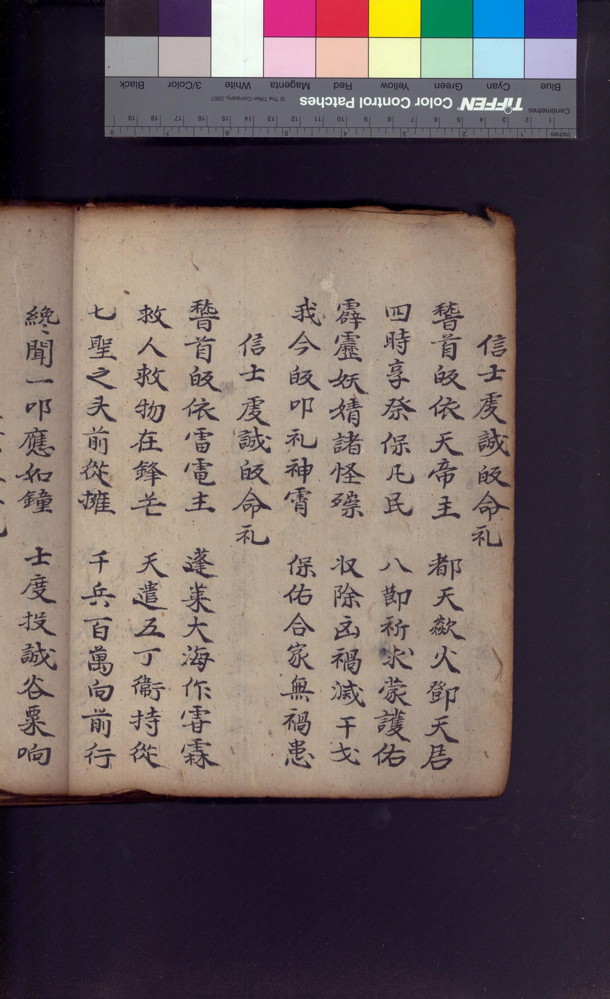

In [7]:
# @title Inspect a random page from the downloaded images
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

img_folder = "img"
img_files = [f for f in os.listdir(img_folder) if f.lower().endswith(('.png', '.jpg'))]
random_img_file = random.choice(img_files)
img_path = os.path.join(img_folder, random_img_file)
img = Image.open(img_path)
img

## Connect to Google Drive

We're now going to create a folder in Drive. Feel free to change the name if you like.  The main goal is to create a folder of images that we can access in the next section.

> Start here if you're only working with a folder on Drive and not from a IIIF collection.


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
# @title Name of the folder to create and save images in Drive
destination_folder_name = "EAP550-1-3" # @param {"type":"string"}

In [10]:
import shutil
import os

source_dir = '/content/img'
destination_dir = f'/content/drive/MyDrive/{destination_folder_name}'

os.makedirs(destination_dir, exist_ok=True)

for item in os.listdir(source_dir):
    s = os.path.join(source_dir, item)
    d = os.path.join(destination_dir, item)
    if os.path.isdir(s):
        shutil.copytree(s, d, symlinks=False, ignore=None)
    else:
        shutil.copy2(s, d)
print(f"Contents of {source_dir} copied to {destination_dir}")

Contents of /content/img copied to /content/drive/MyDrive/EAP550-1-3


# Using your own images

Very often, researchers work with materials from several archives and collections. It's also very common to take photos with your phone in the archives.

If you have these kinds of images, you can add them to your folder in Drive.

The next two cells will covert any PDF files or .HEIC files (iPhone) into jpegs for processing.

In [95]:
%pip install -q pymupdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 47.9 MB/s eta 0:00:00


In [96]:
import pymupdf
from tqdm import tqdm

drive_pdfs = Path(destination_dir).glob('**/*.pdf')
for pdf_file in drive_pdfs:
  doc = pymupdf.open(pdf_file)
  for i, page in tqdm(enumerate(doc)):  # iterate through the pages
      pix = page.get_pixmap(dpi=150)
      img = pix.pil_image()
      img.save(f"{pdf_file.parent}/{pdf_file.stem}_{i}.jpg")

1it [00:00,  8.58it/s]


In [97]:
%pip install -q pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 81.3 MB/s eta 0:00:00


In [99]:
from PIL import Image
from pillow_heif import register_heif_opener

# Register the HEIF opener
register_heif_opener()

drive_heic = Path(destination_dir).glob('**/*.HEIC')

for heic_file in tqdm(drive_heic):
  img = Image.open(heic_file)
  img.save(f"{heic_file.parent}/{heic_file.stem}.jpg")


1it [00:01,  1.82s/it]


# 2. Processing Workflow to Extract Text and Metadata

While the descriptions from the first notebook are nice, they're not research data or archival metadata.

This next section details a workflow that will process your materials into a structured format that can be used for research or library systems. This is an example that can be adapted to your specific needs.



### Vision-Language Models

This workshop features a relatively new kind of machine learning model. Traditional optical character recognition (OCR) models look for patterns in an image and map them to machine-readable characters. The process is entirely visual. Recent advances in large language models provide a general understanding of natural language.  Vision-language models add a visual component to the language model. As a result, the model's predictions are informed by the visual features of the handwritten text image as well as the model's knowledge of language. This combination leads to much improved accuracy with text extraction from handwritten documents.

We should note that VLMs also "hallucinate." They will guess even when they're not sure.  In some cases, they will "improve" on your original document by correcting spelling or word choice.  While we cannot use these models uncritically, they very often move us from "could this better?" to "good enough."

> Why not use ChatGPT or Claude?  
> While proprietary frontier models are powerful, they can be very expensive to use at scale. Using open models like Qwen allows you to have more control over costs and data privacy. Additionally, we're using a smaller model (8 billion parameters versus 1 trillion) that is focused on a specific task.

In [11]:
!pip install -q langchain==0.3.27 langchain-core==0.3.79 langgraph nest-asyncio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 449.8/449.8 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.4/155.4 kB 13.9 MB/s eta 0:00:00


# Sending your files to the model

Before we can send your files to the model, we first need to encode them.

The most common way to do this is to encode the binary data in your file as a string of characters using the base64 encoding system.  So rather than sending ones and zeros over the Internet, we'll be sending packets of text characters.  On the other end, the model turns that data back into an image file to process.

In [12]:
# @title Encode images for transfer over the Internet
import base64
from pathlib import Path

def encode_images(image_directory: str, file_extensions: list = ['.jpg', '.png'], data_uri: bool = True):
    """Generator to encode images in the specified directory to base64 strings.

    Args:
        image_directory (Path): The directory containing images to encode.
        file_extensions (list, optional): List of file extensions to consider. Defaults to ['.jpg', '.png'].
        data_uri (bool, optional): If True, includes the data URI scheme in the output. Defaults to True.

    Yields:
        str: Base64 encoded string of each image.
    """
    image_directory = Path(image_directory)
    if not image_directory.is_dir():
        raise ValueError(f"The provided path {image_directory} is not a valid directory.")
    image_paths = [p for p in image_directory.iterdir() if p.suffix.lower() in file_extensions]
    for path in image_paths:
        with open(path, 'rb') as img_file:
            encoded_string = base64.b64encode(img_file.read()).decode('utf-8')
            if data_uri:
                mime_type = 'image/jpeg' if path.suffix.lower() == '.jpg' else 'image/png'
                yield path, f"data:{mime_type};base64,{encoded_string}"
            else:
                yield path, encoded_string




# Add the API Key
For this workshop, we'll provide a key that you can use to connect with Alibaba's servers in Singapore. The model that we're using is open-source and can be run locally or on high performance computing.

To add the API key,
- click on the key icon to the left.
- Add new secret.
- Under name enter: DASHSCOPE_API_KEY
- Under Value enter:

Please note that the key will not work after the workshop. You are welcome to get a key yourself or connect with any of the other providers listed [here](https://openrouter.ai/qwen/qwen3-vl-8b-instruct/providers).
To create a key with Alibaba:
- [Create an Alibaba Cloud account](https://account.alibabacloud.com/register/intl_register.htm)
- [Create an API key](https://www.alibabacloud.com/help/en/model-studio/get-api-key)

In [13]:
from google.colab import userdata

base_url="https://dashscope-intl.aliyuncs.com/compatible-mode/v1"
api_key= userdata.get('DASHSCOPE_API_KEY') # We will provide you with an API key for the workshop
model = "qwen3-vl-plus" #or "qwen3-vl-flash" (faster and cheaper), "qwen-vl-ocr" (for typewritten texts) For a full list of available models, see https://www.alibabacloud.com/help/en/model-studio/models

While we're using Alibaba for the workshop, we are deliberately model and provider agnostic.  

Hugging Face 🤗
```python
base_url="https://router.huggingface.co/v1"
api_key=userdata.get('HF_TOKEN')
model="Qwen/Qwen3-VL-30B-A3B-Instruct:novita"
```
OpenAI
 ```python
 base_url="https://api.openai.com/v1"
 api_key=userdata.get('OPENAI_API_KEY')
 model = 'gpt-5-mini'
 ```
Anthropic
 ```python
 base_url="https://api.anthropic.com/v1"
 api_key=userdata.get('ANTHROPIC_API_KEY')
 model = 'claude-sonnet-4-20250514'
 ```


In [14]:
# @title Code that sends the encoded image to the server
import os
import asyncio
import aiohttp
from openai import AsyncOpenAI
from tqdm.asyncio import tqdm

# Use AsyncOpenAI instead of OpenAI
client = AsyncOpenAI(
    api_key=api_key,
    base_url=base_url,
)

async def transcribe_image(img: tuple, session: aiohttp.ClientSession, semaphore: asyncio.Semaphore):
    """Process a single image with rate limiting and timeout"""
    async with semaphore:  # Limit concurrent requests
        image_path = img[0]
        image_b64 = img[1]
        file = {
            "name": image_path.name,
        }
        #print(f"Starting to process: {image_path.name}")

        try:
            # Add timeout to API call as well
            completion = await asyncio.wait_for(
                client.chat.completions.create(
                    model=model,
                    messages=[
                        {
                            "role": "user",
                            "content": [
                                {
                                    "type": "text",
                                    "text": "Extract text from the image. Preserve reading order. Return text as markdown."
                                },
                                {
                                    "type": "image_url",
                                    "image_url": {
                                        "url": image_b64
                                    }
                                }
                            ]
                        }
                    ],
                ),
                timeout=360  # 360 second timeout for API call
            )
            #print(f"Successfully processed: {image_path.name}")
            file["markdown_text"] = completion.choices[0].message.content
            return file
        except asyncio.TimeoutError:
            print(f"API timeout for image {image_path.name}")
            return None
        except Exception as e:
            print(f"Error processing image {image_path.name}: {e}")
            return None

async def transcribe_all_images(images, max_concurrent=3):
    """Process all images concurrently with a limit on concurrent requests"""
    # Create aiohttp session for connection pooling
    connector = aiohttp.TCPConnector(limit=10, limit_per_host=5)
    timeout = aiohttp.ClientTimeout(total=300)  # 5 minute total timeout

    async with aiohttp.ClientSession(connector=connector, timeout=timeout) as session:
        semaphore = asyncio.Semaphore(max_concurrent)

        # Create tasks for all images
        tasks = [transcribe_image(image, session, semaphore) for image in images]

        # Process with progress bar
        results = []
        completed_count = 0

        for task in tqdm.as_completed(tasks, total=len(tasks), desc="Processing images"):
            try:
                result = await task
                completed_count += 1
                if result is not None:
                    results.append(result)
                #print(f"Completed {completed_count}/{len(tasks)} images")
            except Exception as e:
                print(f"Task failed with error: {e}")
                completed_count += 1

    return results

async def ner_image(image: dict, session: aiohttp.ClientSession, semaphore: asyncio.Semaphore):
    """Process a single image with rate limiting and timeout"""
    async with semaphore:  # Limit concurrent requests
        text = image["markdown_text"]

        try:
            # Add timeout to API call as well
            completion = await asyncio.wait_for(
                client.chat.completions.create(
                    model= 'qwen-flash', #model,
                    messages=[
                        {
                            "role": "user",
                            "content": [
                                {
                                    "type": "text",
                                    "text": f"Identify and list all named entities (people, places, organizations, dates) mentioned in the following text:\n\n{text}\n\n Be sure to note the context of the entity (i.e. a Person is a witness at a trial, or the driver of a car). Return the entities as a JSON array."
                                }
                            ]
                        }
                    ],
                ),
                timeout=360  # 360 second timeout for API call
            )
            #print(f"Successfully processed: {image_path.name}")
            image["entities"] = completion.choices[0].message.content
            return image
        except asyncio.TimeoutError:
            print(f"API timeout for image {image}")
            return None
        except Exception as e:
            print(f"Error processing image {image}: {e}")
            return None

async def ner_all_images(images, max_concurrent=3):
    """Process all images concurrently with a limit on concurrent requests"""
    # Create aiohttp session for connection pooling
    connector = aiohttp.TCPConnector(limit=10, limit_per_host=5)
    timeout = aiohttp.ClientTimeout(total=300)  # 5 minute total timeout

    async with aiohttp.ClientSession(connector=connector, timeout=timeout) as session:
        semaphore = asyncio.Semaphore(max_concurrent)

        # Create tasks for all images
        tasks = [ner_image(image, session, semaphore) for image in images]

        # Process with progress bar
        results = []
        completed_count = 0

        for task in tqdm.as_completed(tasks, total=len(tasks), desc="Extracting entities from  images"):
            try:
                result = await task
                completed_count += 1
                if result is not None:
                    results.append(result)
                #print(f"Completed {completed_count}/{len(tasks)} images")
            except Exception as e:
                print(f"Task failed with error: {e}")
                completed_count += 1

    return results




# State

As we move from step to step in the workflow, we will need something to store the data from prior steps and to make that data available. This object is often called "state" in programming. In the cell below, we create a simple state object to hold our data as we move through the workflow.

Given that we're processing a box of archival materials, I have called it "Box." I find it helpful to think of the fields in the object as columns in a spreadsheet. Each field (box_manifest_uri, image_uris...) gives us a placeholder for information that we'd like to gather during the workflow. How you design your state object can be helpful in deciding what steps are needed in the workflow and what your final output should look like.

In [15]:
# https://langchain-ai.github.io/langgraph/tutorials/workflows/#prompt-chaining
# https://typing.python.org/en/latest/spec/typeddict.html

from typing_extensions import TypedDict

class Box(TypedDict):  # Level: File in EAP
    image_path: str
    box_metadata: dict
    file_lookup: dict
    images: list[dict]


# Steps in the Workflow

In [16]:
# @title Code that details what to do at each step of the workflow
import re
import json
import requests
import srsly
from rich import print
from tqdm.asyncio import tqdm
from pathlib import Path
import nest_asyncio
from openai import OpenAI


# helper functions for the cleaning step
def remove_code_tags(text):
    """Remove code tags (triple backticks) from the text. Also remove tags with language specifiers such as ```yaml."""
    return re.sub(r"```[a-zA-Z]*\n(.*?)\n```", r"\1", text, flags=re.DOTALL)

def remove_repeated_phrases(text):
    """Remove repeated phrases in the text."""
    # This regex looks for any phrase (sequence of words) that is repeated consecutively
    pattern = r"(\b\w+(?: \w+){0,5}\b)( \1)+"
    return re.sub(pattern, r"\1", text)

def clean_json(invalid_json:str) -> json:
    output = []

    # Remove leading/trailing fence lines like ```json ... ``` (tolerant)
    s = invalid_json.strip()
    if s.startswith('```'):
        # drop first fence line
        parts = s.split('\n', 1)
        if len(parts) == 2:
            s = parts[1]
        # drop trailing fence if present
        if s.endswith('```'):
            s = s[:-3].rstrip()

    # Try a strict JSON parse first (fast and correct when valid)
    try:
        parsed = json.loads(s)
        if isinstance(parsed, list):
            return parsed
        if isinstance(parsed, dict):
            return [parsed]
        return []
    except Exception:
        # fall through to tolerant parsing
        pass

    # Fallback: extract {...} blocks and parse fields tolerant to unescaped quotes
    blocks = re.findall(r'\{.*?\}', s, re.DOTALL)
    for block in blocks:
        ent = {}
        # entity and type are usually safe to capture with a simple regex
        m_entity = re.search(r'"entity"\s*:\s*"([^"]*)"', block)
        if m_entity:
            ent['entity'] = m_entity.group(1).strip()
        m_type = re.search(r'"type"\s*:\s*"([^"]*)"', block)
        if m_type:
            ent['type'] = m_type.group(1).strip()
        # context may contain unescaped quotes; capture between the first quote after the colon
        # and the last quote in the block (heuristic but works for this data)
        idx = block.find('"context"')
        if idx != -1:
            pos_col = block.find(':', idx)
            first_q = block.find('"', pos_col + 1)
            last_q = block.rfind('"')
            if first_q != -1 and last_q > first_q:
                context = block[first_q + 1:last_q]
                ent['context'] = context.strip()
        if ent:
            output.append(ent)

    return output

# https://docs.langchain.com/oss/python/langgraph/workflows-agents


# Steps
def load_manifest(state: Box) -> Box:
    img_path = state["image_path"]
    if Path(f'{img_path}/info.json').exists():
        info = srsly.read_json(f'{img_path}/info.json')
        manifest_url = info.get('url', None)
        if not 'http' in manifest_url:
            manifest = srsly.read_json("/content/manifest.json")
        else:
          header = {
              "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/11"
          }
          manifest = requests.get(manifest_url, headers=header)
          if manifest.status_code != 200:
              raise Exception(f"Error downloading manifest: {manifest.status_code}")

          manifest = manifest.json()
        context = manifest.get('@context')
        metadata = {}

        if '3' in context:
          metadata["label"] = manifest['label']['en'][0]
          for item in manifest.get('metadata', []):
            metadata[item['label']['en'][0]] = item['value']['en'][0]

        elif '2' in context:
          metadata["label"] = manifest.get('label', 'unknown_box')
          for item in manifest["metadata"]:
            metadata[item["label"]] = item["value"]
          print(f"Loaded manifest for {metadata.get('Identifier', 'unknown_box')}")

        file_lookup = info['images']
        return {
            "box_metadata": metadata,
            "file_lookup": file_lookup
        }
    else:
        return {
            "box_metadata": {},
            "file_lookup": {}
        }


def text_recognition(state: Box) -> Box:
    """Extract text from images using OCR (synchronous wrapper).

    This step prefers to use an already-produced `output` variable (from a prior
    async cell). If `output` isn't available it will attempt to run the
    async processing, applying nest_asyncio when running inside a Jupyter
    event loop. If nest_asyncio isn't available, instruct the user to run the
    async cell to produce `output`.
    """

    # If the async cell has already produced `output`, reuse it (fast and safe).
    if "output" in globals() and isinstance(output, list):
        print("✅ Using existing OCR results...")
        state["images"] = output
        return state

    # Otherwise attempt to run the async processing synchronously.
    print("🔍 Starting text recognition...")

    # Count images for progress display
    #img_dir = Path("img")
    #image_files = list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png"))
    #print(f"📊 Found {len(image_files)} images to process")
    img_path = state["image_path"]
    images_gen = encode_images(img_path)
    try:
        loop = asyncio.get_event_loop()
    except RuntimeError:
        # No running loop, create and run one
        print("🚀 Creating new event loop...")
        state["images"] = asyncio.run(transcribe_all_images(images_gen, max_concurrent=15))
        return state

    # If we're in a running event loop (typical in Jupyter), try nest_asyncio to allow run_until_complete.
    if loop.is_running():
        try:
            #print("⚙️ Applying nest_asyncio for Jupyter compatibility...")
            nest_asyncio.apply(loop)
            state["images"] = loop.run_until_complete(transcribe_all_images(images_gen, max_concurrent=15))
            return state
        except Exception as e:
            print(f"❌ Error with nest_asyncio: {e}")
            raise RuntimeError(
                "Cannot run async OCR inside the current event loop. "
                "Either install `nest_asyncio` or run the async cell that awaits `transcribe_all_images(...)` "
                "so that a global `output` variable is available."
            )

    # If event loop not running, run the coroutine directly
    print("🔄 Running coroutine directly...")
    state["images"] = loop.run_until_complete(transcribe_all_images(images_gen, max_concurrent=15))
    return state

def entity_recognition(state: Box) -> Box:
    """Recognize entities in the extracted text."""
    # If the async cell has already produced `ner_output`, reuse it (fast and safe).
    if "ner_output" in globals() and isinstance(output, list):
        print("✅ Using existing NER results...")
        state["entities"] = output
        return state

    # Otherwise attempt to run the async processing synchronously.
    print("🏷️ Starting entity recognition...")
    images = state["images"]
    try:
        loop = asyncio.get_event_loop()
    except RuntimeError:
        # No running loop, create and run one
        print("🚀 Creating new event loop...")
        state["images"] = asyncio.run(ner_all_images(images, max_concurrent=15))
        return state

    # If we're in a running event loop (typical in Jupyter), try nest_asyncio to allow run_until_complete.
    if loop.is_running():
        try:
            #print("⚙️ Applying nest_asyncio for Jupyter compatibility...")
            nest_asyncio.apply(loop)
            state["images"] = loop.run_until_complete(ner_all_images(images, max_concurrent=15))
            return state
        except Exception as e:
            print(f"❌ Error with nest_asyncio: {e}")
            raise RuntimeError(
                "Cannot run async OCR inside the current event loop. "
                "Either install `nest_asyncio` or run the async cell that awaits `ner_all_images(...)` "
                "so that a global `output` variable is available."
            )

    # If event loop not running, run the coroutine directly
    print("🔄 Running coroutine directly...")
    state["images"] = loop.run_until_complete(ner_all_images(images, max_concurrent=15))
    return state


def clean_response(state: Box) -> Box:
    """Clean the model response by removing code tags and repeated phrases."""
    from tqdm import tqdm

    print("🧹 Cleaning responses...")
    images = state["images"]
    for image in tqdm(images, desc="Cleaning text"):
        text = image["markdown_text"]
        text = remove_code_tags(text)
        text = remove_repeated_phrases(text)
        image["cleaned_text"] = text
        for key, value in state["file_lookup"].items():
            if key == image["name"]:
                image["image_uri"] = value
                break
        # Assert that entities is valid JSON
        if not isinstance(image["entities"], list):
            image["entities"] = clean_json(image["entities"])
    state["images"] = images
    return state

def save_state(state: Box) -> Box:
    identifier = state["box_metadata"].get("Identifier", "unknown_box")
    if isinstance(identifier, list):
        identifier = identifier[0]

    box_id = identifier.replace(" ", "_").replace("/", "_")

    # if not output directory, create it
    import os

    os.makedirs("output", exist_ok=True)
    with open(f"output/{box_id}.json", "w") as f:
        json.dump(state, f, indent=4)
    print(f"💾 Saved processed state to output/{box_id}.json")
    return state

In [17]:
from langgraph.graph import StateGraph, START, END


# Build workflow
builder = StateGraph(Box)

# Add nodes
builder.add_node("load_manifest", load_manifest)
builder.add_node("text_recognition", text_recognition)
builder.add_node("entity_recognition", entity_recognition)
builder.add_node("clean_response", clean_response)
builder.add_node("save_state", save_state)

# Add edges to connect nodes
builder.add_edge(START, "load_manifest")
builder.add_edge("load_manifest", "text_recognition")
builder.add_edge("text_recognition", "entity_recognition")
builder.add_edge("entity_recognition", "clean_response")
builder.add_edge("clean_response", "save_state")
builder.add_edge("save_state", END)

# Compile
graph = builder.compile()

In [18]:
# Invoke

output = graph.invoke({"image_path":f"/content/drive/MyDrive/{destination_folder_name}"})

🔍 Starting text recognition...

Processing images: 100%|██████████| 65/65 [00:43<00:00,  1.51it/s]


🏷️ Starting entity recognition...

Extracting entities from  images: 100%|██████████| 65/65 [00:44<00:00,  1.47it/s]


🧹 Cleaning responses...

Cleaning text: 100%|██████████| 65/65 [00:00<00:00, 12512.27it/s]


💾 Saved processed state to output/EAP550_1_3.json

In [19]:
# inspect results
import random
from IPython.display import Image

images = output.get('images')
image = random.choice(images)

print(image)
Image(url=image["image_uri"], width=400)


{
    'name': 'EAP550_1_3_53.jpg',
    'markdown_text': 
'```markdown\n時社稷運天三百六十度傳善惡以無\n差祭下土四季七十二侯言函有報年\n逢惡煞命直災厄所犯雷王運逢病患\n或注
災殃而臨照正直於雷傷而逢体\n內當非解謝之門各家清吉弟子么等\n自此回作吉変禍為祥上消口舌官罗\n下滅刑囚寇盜直諸災難 
伏願\n衆聖雷傷病患蠲消免無患難四季全\n安年年益旺於家門稽首皈依虔誠讚\n```',
    'entities': [
        {
            'entity': '時社稷運天',
            'type': 'organization',
            'context': 'A celestial or cosmic system associated with the governance and fortune of the state, 
possibly a metaphysical or ritualistic concept in Chinese cosmology.'
        },
        {
            'entity': '雷王',
            'type': 'person',
            'context': 'A divine or supernatural figure associated with thunder and punishment; appears to be a 
deity invoked in rituals for protection from disasters.'
        },
        {
            'entity': '衆聖',
            'type': 'organization',
            'context': 'A collective term for multiple deities or sacred beings, invoked in prayers for the 
elimination of illness and misfortune.'
        }
    ],
    'cleaned_text': 
'時社稷運天三百六十度傳善惡以無\n差祭下土四季七十二侯言函有報年\n逢惡煞命直災厄所犯雷王運逢病患\n或注災殃而臨照正直
於雷傷而逢体\n內當非解謝之門各家清吉弟子么等\n自此回作吉変禍為祥上消口舌官罗\n下滅刑囚寇盜直諸災難 
伏願\n衆聖雷傷病患蠲消免無患難四季全\n安年年益旺於家門稽首皈依虔誠讚',
    'image_uri': 'https://images.eap.bl.uk/EAP550/EAP550_1_3/53.jp2/full/full/0/default.jpg'
}

# 3. Saving and Publishing

Now that you've run the workflow in the previous notebook, it's time to turn that data into something familiar that you can use. In this section, we'll turn the output JSON file into a spreadsheet and a static website.  

## Create a spreadsheet


In [21]:
import shutil
from pathlib import Path

output_path = '/content/output'
data_files = Path(output_path).glob("*.json")
data_files = list(data_files)
print(f"Found {len(data_files)} file(s)")

Found 1 file(s)

In [22]:
# name, image_uri, cleaned_text, box_metadata>"Idenfifier"
import srsly
from csv import DictWriter


def output_json_to_spreadsheet(data_files: list):
  rows = []
  for data_file in data_files:
    data = srsly.read_json(data_file)
    box_identifier = data.get('box_metadata', 'unlabeled_box').get('Identifier','')
    images = data.get('images',[])
    # sort the images by filename
    images = sorted(images, key=lambda x: x.get('name',''))
    for image in images:
      rows.append({
          'name': image.get('name',''),
          'image_uri': image.get('image_uri',''),
          'cleaned_text': image.get('cleaned_text',''),
          'box_identifier': box_identifier
      })
  writer = DictWriter(open(data_file.with_suffix('.csv'),'w'), fieldnames=rows[0].keys())
  writer.writeheader()
  writer.writerows(rows)

output_json_to_spreadsheet(data_files)

Save the output.csv file to Drive

In [23]:
# sync content in folders
import shutil

source_dir = '/content/output'
destination_dir = f"/content/drive/MyDrive/{destination_folder_name}/output/"

shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True)

'/content/drive/MyDrive/ark-81431/output/'

With the file saved, you can now go to Drive to work with your data.
- In your folder, you'll find an `output` subfolder
- click to open the `output.csv` file
- Then click on "Open in Google Sheets" (center top of the page)

## Create a static website

In [24]:
import srsly
import markdown
from pathlib import Path

if not Path('_site').exists():
  Path('_site').mkdir()

for data_file in data_files:
    data = srsly.read_json(data_file)
    images = data.get('images',[])
    images = sorted(images, key=lambda x: x.get('name',''))
    first_image = images[0]['name'] + ".html"
    last_image = images[-1]['name'] + ".html"
    for idx, image in enumerate(images):
        next_image = images[idx+1]['name'] + ".html" if idx < len(images)-1 else first_image
        prev_image = images[idx-1]['name'] + ".html" if idx > 0 else last_image
        cleaned_text = image.get('cleaned_text','')
        cleaned_text = markdown.markdown(cleaned_text, extensions=['tables'])
        sort_value = int("".join([char for char in image["name"] if char.isdigit()]))
        html_template = f"""
        <!DOCTYPE html>
        <html>
          <body>
            <button><a href="/">Back to Search</a></button>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
            <button><a href="{prev_image}">Back</a></button>
            <button><a href="{next_image}">Forward</a></button>

            <h1 data-pagefind-sort="page:{sort_value}">{image["name"]}</h1>
            <img src="{image["image_uri"]}">
            <p>{cleaned_text}</p>
            <table>
              <tr>
                <th>Entity</th>
                <th>Type</th>
                <th>Context</th>
              </tr>
              {[f"<tr><td>{entity["entity"]}</td><td>{entity["type"]}</td><td>{entity["context"]}</td></tr>" for entity in image["entities"] if isinstance(entity, dict) and entity.get('entity',None) and entity.get('type',None) and entity.get('context', None)]}
            </table>
          </body>
        </html>
        """
        Path(f"_site/{image['name']}.html").write_text(html_template)

In [25]:
full_metadata_html = ""
for data_file in data_files:
    data = srsly.read_json(data_file)
    box_metadata = data.get('box_metadata',{})
    identifier = box_metadata.get('Identifier','no_identifier')
    full_metadata_html += f"<h1>{identifier}</h1>"
    for key, value in box_metadata.items():
      full_metadata_html += f"<h2>{key}</h2>"
      full_metadata_html += f"<p>{value}</p><br>"
    full_metadata_html += "<hr>"

index = f"""

<!DOCTYPE html>
        <html>
          <head>
          <link href="/pagefind/pagefind-ui.css" rel="stylesheet">
          <script src="/pagefind/pagefind-ui.js"></script>
          </head>
          <body>
            <div id="search"></div>
            {full_metadata_html}"""
index += """
            <script>
                window.addEventListener('DOMContentLoaded', (event) => {
                    new PagefindUI({
                      element: "#search",
                      sort: { date: "desc" },
                      showSubResults: true
                    });

                });
            </script>
             </body>
        </html>
"""
Path('_site/index.html').write_text(index)

2770

Create a search index

In [26]:
%pip install -q 'pagefind[extended]'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 MB 6.5 MB/s eta 0:00:00


In [27]:
!python3 -m pagefind --site _site


Running Pagefind v1.4.0 (Extended)
Running from: "/content"
Source:       "_site"
Output:       "_site/pagefind"

[Walking source directory]
Found 4 files matching **/*.{html}

[Parsing files]
Did not find a data-pagefind-body element on the site.
↳ Indexing all <body> elements on the site.

[Reading languages]
Discovered 1 language: unknown

[Building search indexes]
Total: 
  Indexed 1 language
  Indexed 4 pages
  Indexed 1637 words
  Indexed 0 filters
  Indexed 1 sort

Finished in 0.281 seconds


In [28]:
import shutil
zip_file = shutil.make_archive('site', 'zip', '/content/_site')

In [29]:
# Save the zip file to Drive
import shutil

source_file = '/content/site.zip'
destination_dir = f"/content/drive/MyDrive/{destination_folder_name}/output/"

shutil.copy(source_file, destination_dir)

'/content/drive/MyDrive/ark-81431/output/site.zip'

In [30]:
from google.colab import files
files.download(zip_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Open the website on your computer

You can then unzip the `site.zip` file on your computer and view it in your web browser.

- Open your terminal application
- Navigate to the unzipped folder (ex. `cd ~/Downloads/site`)
- Enter this command `python -m http.server` and press enter.
- The site should now be visible in the browser at http://0.0.0.0:8000/


## Deploy your website to the web

There are many ways to put your site up on the web.  One of the simplest is a company called Netlify, which has a nice free tier.

- Create an account with Netlify: https://app.netlify.com/signup
- Login in to the new account
- Select the Projects tab on the left
- Then select Add New Project
- In the dropdown, select Deploy Manually
- Drag and drop the unzipped `site` folder from your computer
- Once uploaded, you should see a URL for your site. Something like `33242-fish-pickle.netlify.app`
- You can change the web address in General > Project Details > Change Project Name
- For example, I changed the address to: https://eap617-1-10.netlify.app


## Collaborations with Libraries, Archives and Museums

While it's great to have a spreadsheet or static page to work from, ideally we'll find ways for transcriptions and data to find their way back to the British Library and other libraries and museums. Librarians and archivists are hard at work developing this capability.  For example, the Swedish National Archives, recently added the ability to search over 3 million hand-written documents.  

- [Here is a post about this work (in Swedish and English)](https://riksarkivet.se/inlagg/riksarkivet-gor-en-miljon-handskrivna-dokument-sokbara)
- [Here is an example search result](https://sok.riksarkivet.se/bildvisning/A0065892_00072#?q=blau&xywh=-957%2C0%2C7736%2C4863&hi=3&cv=71)